In [1]:
# importing libraries
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

In [2]:
# Reading the Data
df = pd.read_csv(r'C:\Users\pinak\Downloads\movies.csv')

In [3]:
df.head()

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98


In [4]:
df

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,0,Drama,2020,"October 23, 2020 (United States)",3.1,18,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,0,0,90
7664,Dream Round,0,Comedy,2020,"February 7, 2020 (United States)",4.7,36,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,0,0,Cactus Blue Entertainment,90
7665,Saving Mbango,0,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,0,Embi Productions,0
7666,It's Just Us,0,Drama,2020,"October 1, 2020 (United States)",0.0,0,James Randall,James Randall,Christina Roz,United States,15000,0,0,120


In [5]:
# finding the missing data
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 0%
genre - 0%
year - 0%
released - 0%
s - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 0%
gross - 0%
company - 0%
runtime - 0%


In [6]:
# data types of the columns
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
s           float64
votes         int64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime       int64
dtype: object

In [7]:
# extracting the year from the released date
df = df.dropna(how = 'any',axis = 0)

In [8]:
df['yearcorrect'] = df['released'].astype(str).str.split(',').str[-1].astype(str).str[:5]

In [9]:
df

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,0,Drama,2020,"October 23, 2020 (United States)",3.1,18,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,0,0,90,2020
7664,Dream Round,0,Comedy,2020,"February 7, 2020 (United States)",4.7,36,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,0,0,Cactus Blue Entertainment,90,2020
7665,Saving Mbango,0,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,0,Embi Productions,0,2020
7666,It's Just Us,0,Drama,2020,"October 1, 2020 (United States)",0.0,0,James Randall,James Randall,Christina Roz,United States,15000,0,0,120,2020


In [21]:
df = df.sort_values(by = ['gross'], inplace = False, ascending = False)

In [13]:
pd.set_option('display.max_rows', None)

In [14]:
# Drop any duplicates
df['company'].sort_values(ascending = False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
352                                      Zoetrope Studios
447                                      Zoetrope Studios
520                                      Zoetrope Studios
146                                      Zoetrope Studios
332                                      Zoetrope Studios
724                                      Zoetrope Studios
302                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222          

In [17]:
# droping the duplicates
df['company'] = df['company'].drop_duplicates()

0                                            Warner Bros.
1                                       Columbia Pictures
2                                               Lucasfilm
3                                      Paramount Pictures
4                                          Orion Pictures
5                                                     NaN
6                                      Universal Pictures
7                            Chartoff-Winkler Productions
8                                          Dovemead Films
9                                          United Artists
10                                    The Malpaso Company
11                                           C.A.T. Films
12                                                    NaN
13                                                    NaN
14                                      Filmways Pictures
15                                        Rastar Pictures
16                              Metro-Goldwyn-Mayer (MGM)
17            

In [19]:
df

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,NaN,95,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100,1980


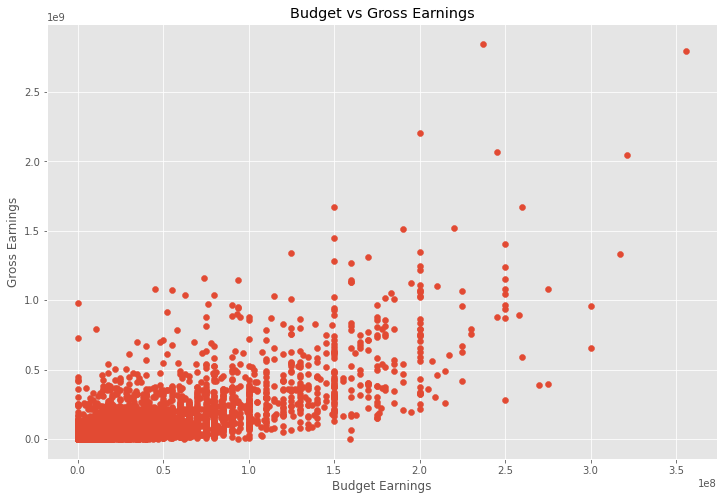

In [23]:
# scatter plot with budget vs gross

plt.scatter(x = df['budget'], y = df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Budget Earnings')
plt.ylabel('Gross Earnings')
plt.show()

In [22]:
df.head()

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,NaN,162,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,NaN,181,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,NaN,194,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,NaN,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,NaN,149,2018


<AxesSubplot:xlabel='budget', ylabel='gross'>

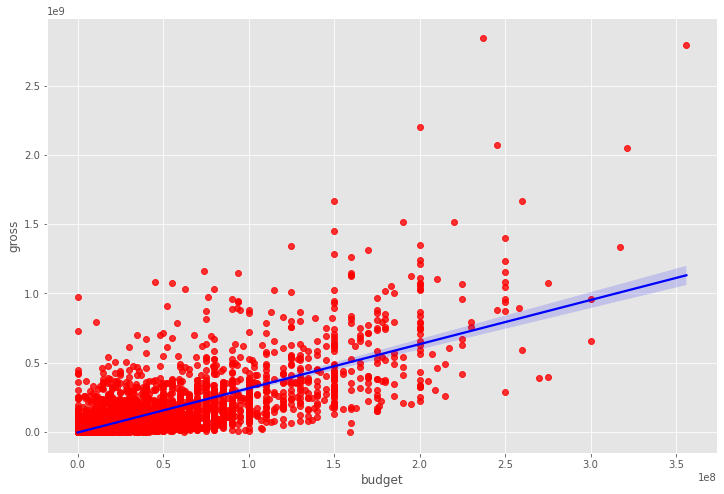

In [27]:
# plot the budget vs Gross using seaborn

sns.regplot(x = 'budget', y = 'gross', data = df, scatter_kws = {"color": "red"}, line_kws = {"color" : "blue"})

In [33]:
# finding the correlation

df.corr(method = 'pearson') # pearson, kendall, spearman

,year,s,votes,budget,gross,runtime
year,1.000000,0.092616,0.222427,0.309212,0.261900,0.116358
s,0.092616,1.000000,0.407101,0.056863,0.186012,0.394564
votes,0.222427,0.407101,1.000000,0.486931,0.632870,0.306984
budget,0.309212,0.056863,0.486931,1.000000,0.750157,0.268372
gross,0.261900,0.186012,0.632870,0.750157,1.000000,0.244339
runtime,0.116358,0.394564,0.306984,0.268372,0.244339,1.000000


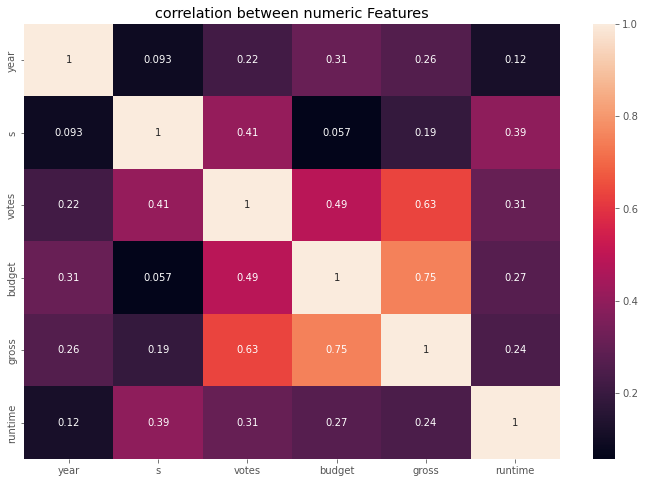

In [35]:
# plotting the correlation

correlation_matrix = df.corr(method = 'pearson')
plt.title('correlation between numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
sns.heatmap(correlation_matrix, annot = True)
plt.show()

In [36]:
# Look at company
df_numerized = df.copy()
for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized        

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,536,6,0,2009,697,7.8,1100000,1161,1788,2335,56,237000000,2847246203,-1,162,29
7445,538,6,0,2019,184,8.4,903000,168,753,2242,56,356000000,2797501328,-1,181,39
3045,6896,6,6,1997,705,7.8,1100000,1161,1788,1597,56,200000000,2201647264,-1,194,17
6663,5144,6,0,2015,699,7.8,876000,1131,2560,526,56,245000000,2069521700,-1,138,35
7244,539,6,0,2018,193,8.4,897000,168,753,2242,56,321000000,2048359754,-1,149,38
7480,6195,5,2,2019,1489,6.9,222000,1461,1929,678,56,260000000,1670727580,-1,118,39
6653,2972,6,0,2015,1705,7.0,593000,523,3569,439,56,150000000,1670516444,-1,124,35
6043,5503,6,0,2012,2473,8.0,1300000,1523,2324,2242,56,220000000,1518815515,1607,143,32
6646,2148,6,0,2015,222,7.1,370000,1195,716,2722,56,190000000,1515341399,-1,137,35
7494,2134,5,2,2019,2677,6.8,148000,438,1960,1529,56,150000000,1450026933,-1,103,39


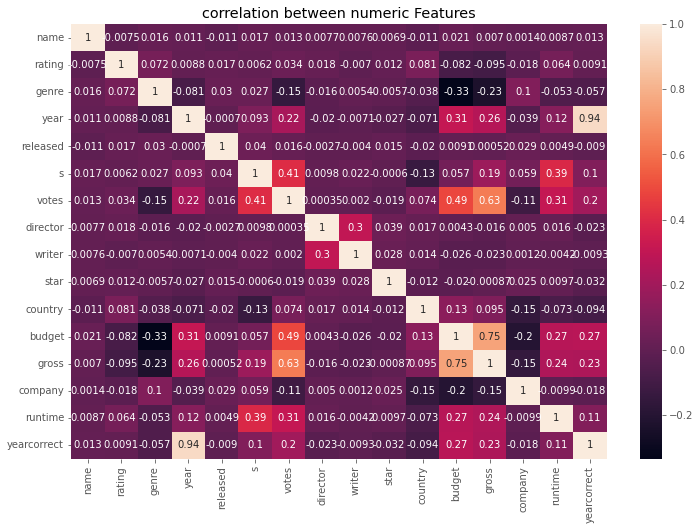

In [37]:
correlation_matrix = df_numerized.corr(method = 'pearson')
plt.title('correlation between numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
sns.heatmap(correlation_matrix, annot = True)
plt.show()

In [38]:
df_numerized.corr()

,name,rating,genre,year,released,s,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,-0.007455,0.016263,0.010999,-0.010853,0.016520,0.013249,0.007686,0.007567,0.006935,-0.011052,0.020523,0.006976,0.001369,0.008699,0.012515
rating,-0.007455,1.000000,0.072423,0.008779,0.016613,0.006192,0.033743,0.017803,-0.007044,0.012026,0.081244,-0.081939,-0.095450,-0.018393,0.064133,0.009078
genre,0.016263,0.072423,1.000000,-0.081261,0.029822,0.027384,-0.145296,-0.015612,0.005416,-0.005671,-0.037615,-0.334021,-0.234297,0.099805,-0.052914,-0.056740
year,0.010999,0.008779,-0.081261,1.000000,-0.000695,0.092616,0.222427,-0.020345,-0.007063,-0.027044,-0.070938,0.309212,0.261900,-0.038537,0.116358,0.939525
released,-0.010853,0.016613,0.029822,-0.000695,1.000000,0.039814,0.015878,-0.002723,-0.003974,0.015098,-0.020427,0.009145,0.000519,0.028691,0.004852,-0.009035
s,0.016520,0.006192,0.027384,0.092616,0.039814,1.000000,0.407101,0.009804,0.021841,-0.000602,-0.133346,0.056863,0.186012,0.059028,0.394564,0.100719
votes,0.013249,0.033743,-0.145296,0.222427,0.015878,0.407101,1.000000,0.000350,0.001955,-0.018849,0.073525,0.486931,0.632870,-0.109983,0.306984,0.197562
director,0.007686,0.017803,-0.015612,-0.020345,-0.002723,0.009804,0.000350,1.000000,0.301363,0.039383,0.016971,0.004312,-0.015695,0.004986,0.015733,-0.022685
writer,0.007567,-0.007044,0.005416,-0.007063,-0.003974,0.021841,0.001955,0.301363,1.000000,0.027730,0.014284,-0.025867,-0.022893,0.001176,-0.004239,-0.009305
star,0.006935,0.012026,-0.005671,-0.027044,0.015098,-0.000602,-0.018849,0.039383,0.027730,1.000000,-0.012014,-0.019538,-0.000866,0.024952,0.009671,-0.031753


In [39]:
correlation_matrix = df_numerized.corr()
corr_pairs = correlation_matrix.unstack()
corr_pairs

name         name           1.000000
             rating        -0.007455
             genre          0.016263
             year           0.010999
             released      -0.010853
             s              0.016520
             votes          0.013249
             director       0.007686
             writer         0.007567
             star           0.006935
             country       -0.011052
             budget         0.020523
             gross          0.006976
             company        0.001369
             runtime        0.008699
             yearcorrect    0.012515
rating       name          -0.007455
             rating         1.000000
             genre          0.072423
             year           0.008779
             released       0.016613
             s              0.006192
             votes          0.033743
             director       0.017803
             writer        -0.007044
             star           0.012026
             country        0.081244
 

In [40]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

budget       genre         -0.334021
genre        budget        -0.334021
             gross         -0.234297
gross        genre         -0.234297
budget       company       -0.201754
company      budget        -0.201754
country      company       -0.150258
company      country       -0.150258
             gross         -0.149672
gross        company       -0.149672
genre        votes         -0.145296
votes        genre         -0.145296
country      s             -0.133346
s            country       -0.133346
votes        company       -0.109983
company      votes         -0.109983
rating       gross         -0.095450
gross        rating        -0.095450
country      yearcorrect   -0.093676
yearcorrect  country       -0.093676
budget       rating        -0.081939
rating       budget        -0.081939
year         genre         -0.081261
genre        year          -0.081261
runtime      country       -0.073319
country      runtime       -0.073319
             year          -0.070938
y

In [41]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

votes        gross          0.632870
gross        votes          0.632870
budget       gross          0.750157
gross        budget         0.750157
year         yearcorrect    0.939525
yearcorrect  year           0.939525
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
s            s              1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64